# ỨNG DỤNG CÁC PHƯƠNG PHÁP HỌC MÁY TRONG DỰ BÁO CHẤT LƯỢNG KHÔNG KHÍ TẠI THỦ ĐÔ HÀ NỘI

### Bước 1: Import libraries & bộ dữ liệu

In [3]:
import datetime
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

In [5]:
df = pd.read_csv('hanoi_aqi_data.csv')
df.head()

,Local Time,City,AQI,CO,NO2,O3,PM10,PM25,SO2,Clouds,Precip,Pres,Rh,Solar_rad,Temp,Vis,Wind_spd
0,3/1/2022 0:00,Hanoi,150.0,384.0,38.0,45.0,67.5,54.0,84.3,91,0.00,1015,76,0,19.9,10,2.33
1,3/1/2022 1:00,Hanoi,155.0,439.5,47.0,32.0,73.8,59.0,103.0,87,0.00,1014,79,0,19.7,10,2.00
2,3/1/2022 2:00,Hanoi,152.0,529.3,49.7,21.3,71.3,57.0,97.3,91,0.00,1014,80,0,19.6,10,2.00
3,3/1/2022 3:00,Hanoi,153.0,619.2,52.3,10.7,72.5,58.0,91.7,95,0.75,1014,81,0,19.6,10,2.00
4,3/1/2022 4:00,Hanoi,157.0,709.1,55.0,0.0,76.3,61.0,86.0,100,1.50,1014,83,0,19.5,10,2.00


In [7]:
# Convert cột 'Local Time' thành dạng datetime
df['Local Time'] = pd.to_datetime(df['Local Time'])


### Bước 2: Thống kê mô tả và phát hiện missing value

In [10]:
df.describe()

,Local Time,AQI,CO,NO2,O3,PM10,PM25,SO2,Clouds,Precip,Pres,Rh,Solar_rad,Temp,Vis,Wind_spd
count,17544,17542.000000,17470.000000,17470.000000,17470.000000,17542.00000,17542.000000,17470.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000
mean,2023-03-01 11:30:00,119.282408,305.016016,27.306211,61.515655,62.55639,49.047662,68.545186,70.128078,0.302055,1010.130472,76.905837,164.288817,25.093365,10.161993,1.786924
min,2022-03-01 00:00:00,21.000000,9.000000,0.000000,0.000000,1.30000,1.000000,0.000000,0.000000,0.000000,992.000000,17.000000,0.000000,7.700000,0.000000,0.000000
25%,2022-08-30 17:45:00,80.000000,126.725000,11.000000,29.000000,32.50000,25.000000,35.400000,50.000000,0.000000,1004.000000,66.000000,0.000000,21.300000,10.000000,1.000000
50%,2023-03-01 11:30:00,107.000000,172.200000,17.700000,52.000000,47.50000,38.000000,62.150000,75.000000,0.000000,1010.000000,81.000000,15.000000,25.700000,10.000000,2.000000
75%,2023-08-31 05:15:00,153.000000,258.650000,32.000000,85.000000,73.00000,57.000000,94.000000,100.000000,0.000000,1015.000000,90.000000,237.000000,28.900000,10.000000,2.330000
max,2024-02-29 23:00:00,500.000000,13017.000000,378.000000,262.000000,604.00000,446.000000,368.000000,100.000000,28.000000,1033.000000,100.000000,1056.000000,40.000000,16.000000,7.200000
std,NaN,52.305785,584.471113,28.935217,43.784671,52.49683,42.186474,43.452163,29.134187,1.110142,7.242025,16.308081,244.847381,5.459641,2.496233,0.851208


In [11]:
#Phát hiện missing value
df.isnull().sum()

Local Time     0
City           0
AQI            2
CO            74
NO2           74
O3            74
PM10           2
PM25           2
SO2           74
Clouds         0
Precip         0
Pres           0
Rh             0
Solar_rad      0
Temp           0
Vis            0
Wind_spd       0
dtype: int64

In [14]:
df[2933:2942]

,Local Time,City,AQI,CO,NO2,O3,PM10,PM25,SO2,Clouds,Precip,Pres,Rh,Solar_rad,Temp,Vis,Wind_spd
2933,2022-07-01 05:00:00,Hanoi,61.0,NaN,NaN,NaN,21.3,17.0,NaN,50,0.50,1001,82,0,27.3,10,0.66
2934,2022-07-01 06:00:00,Hanoi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56,0.00,1001,84,72,27.3,10,1.33
2935,2022-07-01 07:00:00,Hanoi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62,0.00,1001,87,231,27.4,10,2.00
2936,2022-07-01 08:00:00,Hanoi,67.0,NaN,NaN,NaN,25.0,20.0,NaN,50,0.25,1002,84,452,27.9,10,2.00
2937,2022-07-01 09:00:00,Hanoi,82.0,NaN,NaN,NaN,33.8,27.0,NaN,37,0.50,1002,81,667,28.5,10,2.00
2938,2022-07-01 10:00:00,Hanoi,87.0,NaN,NaN,NaN,36.3,29.0,NaN,25,0.25,1002,78,834,29.0,10,2.00
2939,2022-07-01 11:00:00,Hanoi,82.0,NaN,NaN,NaN,33.8,27.0,NaN,37,0.00,1001,72,907,30.3,10,2.00
2940,2022-07-01 12:00:00,Hanoi,87.0,NaN,NaN,NaN,36.3,29.0,NaN,50,0.00,1000,67,882,31.7,10,2.00
2941,2022-07-01 13:00:00,Hanoi,85.0,NaN,NaN,NaN,35.0,28.0,NaN,62,0.25,1000,62,760,33.0,10,2.00


Bộ dữ liệu df tồn tại missing value ở tất cả các biến AQI, PM2.5, PM10, SO2, O3, NO2, CO

### Bước 3: Xử lý missing value bằng phương pháp nội suy tuyến tính

In [18]:
df.interpolate(method='linear',limit_direction="both",inplace=True)

C:\Users\DELL\AppData\Local\Temp\ipykernel_15080\3491373975.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df.interpolate(method='linear',limit_direction="both",inplace=True)


In [20]:
#Kiểm tra lại missing value
df.isnull().sum()

Local Time    0
City          0
AQI           0
CO            0
NO2           0
O3            0
PM10          0
PM25          0
SO2           0
Clouds        0
Precip        0
Pres          0
Rh            0
Solar_rad     0
Temp          0
Vis           0
Wind_spd      0
dtype: int64

In [22]:
df[2933:2942]

,Local Time,City,AQI,CO,NO2,O3,PM10,PM25,SO2,Clouds,Precip,Pres,Rh,Solar_rad,Temp,Vis,Wind_spd
2933,2022-07-01 05:00:00,Hanoi,61.0,133.600,22.333333,34.00,21.300000,17.0,29.666667,50,0.50,1001,82,0,27.3,10,0.66
2934,2022-07-01 06:00:00,Hanoi,63.0,135.024,22.506667,33.96,22.533333,18.0,29.733333,56,0.00,1001,84,72,27.3,10,1.33
2935,2022-07-01 07:00:00,Hanoi,65.0,136.448,22.680000,33.92,23.766667,19.0,29.800000,62,0.00,1001,87,231,27.4,10,2.00
2936,2022-07-01 08:00:00,Hanoi,67.0,137.872,22.853333,33.88,25.000000,20.0,29.866667,50,0.25,1002,84,452,27.9,10,2.00
2937,2022-07-01 09:00:00,Hanoi,82.0,139.296,23.026667,33.84,33.800000,27.0,29.933333,37,0.50,1002,81,667,28.5,10,2.00
2938,2022-07-01 10:00:00,Hanoi,87.0,140.720,23.200000,33.80,36.300000,29.0,30.000000,25,0.25,1002,78,834,29.0,10,2.00
2939,2022-07-01 11:00:00,Hanoi,82.0,142.144,23.373333,33.76,33.800000,27.0,30.066667,37,0.00,1001,72,907,30.3,10,2.00
2940,2022-07-01 12:00:00,Hanoi,87.0,143.568,23.546667,33.72,36.300000,29.0,30.133333,50,0.00,1000,67,882,31.7,10,2.00
2941,2022-07-01 13:00:00,Hanoi,85.0,144.992,23.720000,33.68,35.000000,28.0,30.200000,62,0.25,1000,62,760,33.0,10,2.00


### Bước 4: Visualization và tìm một số insight của bộ dữ liệu

#### 4.1 AQI hàng giờ của Hà Nội năm (1/3/2022-29/2/2024)

Thời điểm có mức AQI cao nhất là: (Timestamp('2024-02-07 19:00:00'), 500.0)


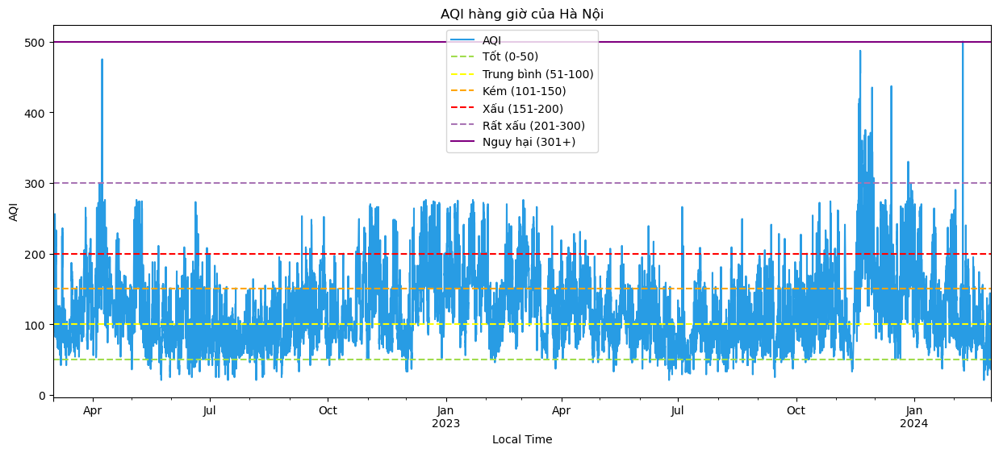

In [26]:
# Đặt cột 'Local Time' là chỉ số - index
df.set_index('Local Time', inplace=True)
#Plot AQI time series line plot
plt.figure(figsize=(15,6))
df['AQI'].plot(kind='line',color='#289ce4')
#Add labels and title
plt.xlabel('Local Time')
plt.ylabel('AQI')
plt.title('AQI hàng giờ của Hà Nội')
#Add horizontal lines for unhealthy levels
plt.axhline(y=50, color='#a0dc4c', linestyle ='--',label='Tốt (0-50)')
plt.axhline(y=100, color='yellow', linestyle ='--',label='Trung bình (51-100)')
plt.axhline(y=150, color='orange', linestyle ='--',label='Kém (101-150)')
plt.axhline(y=200, color='red', linestyle ='--',label='Xấu (151-200)')
plt.axhline(y=300, color='#a874b4', linestyle ='--',label='Rất xấu (201-300)')
plt.axhline(y=500, color='purple', linestyle ='-',label='Nguy hại (301+)')

plt.legend()
#Find the time with the highest AQI level
highest_aqi_time = df['AQI'].idxmax(), df['AQI'].max()
print("Thời điểm có mức AQI cao nhất là:", highest_aqi_time)

#### 4.2 Plot từng biến đầu vào theo trung bình tháng

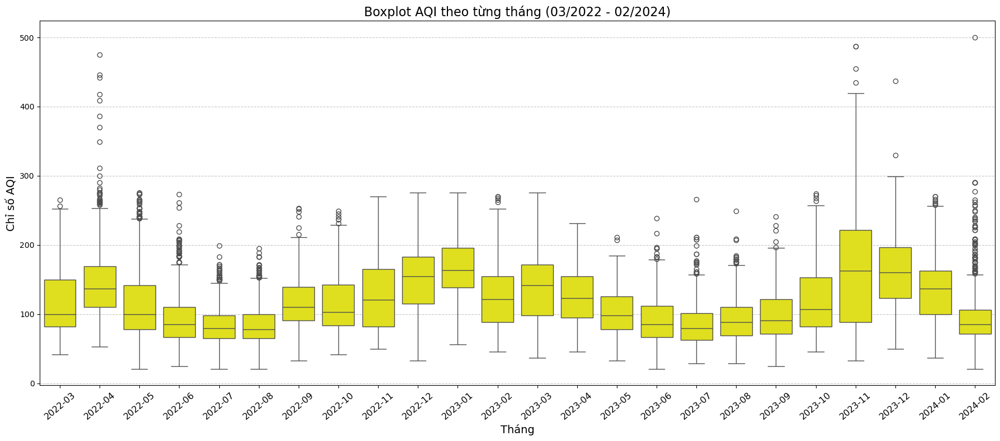

In [28]:
plt.figure(figsize=(18, 8))
sn.boxplot(x=df.index.year.astype(str) + '-' + df.index.month.astype(str).str.zfill(2), y='AQI', data=df, color= 'yellow')

plt.title('Boxplot AQI theo từng tháng (03/2022 - 02/2024)', fontsize=16)
plt.xlabel('Tháng', fontsize=14)
plt.ylabel('Chỉ số AQI', fontsize=14)
plt.xticks(rotation=40, fontsize=11.5)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Hiển thị biểu đồ
plt.tight_layout()
plt.show()

In [30]:
#In ra kết quả từ boxplot trên
df['month_year'] = df.index.year.astype(str) + '-' + df.index.month.astype(str).str.zfill(2)

# Tính các đặc điểm thống kê quan trọng cho từng tháng theo chỉ số index
stats = df.groupby('month_year')['AQI'].apply(lambda x: pd.Series({
    'median': np.median(x),
    'Q1': np.percentile(x, 25),
    'Q3': np.percentile(x, 75),
    'IQR': np.percentile(x, 75) - np.percentile(x, 25),
}))

# In kết quả
pd.set_option('display.max_rows', None)  # Hiển thị tất cả các tháng
print(stats)

month_year        
2022-03     median    100.00
            Q1         82.00
            Q3        150.25
            IQR        68.25
2022-04     median    137.00
            Q1        110.00
            Q3        169.00
            IQR        59.00
2022-05     median    100.00
            Q1         78.00
            Q3        142.00
            IQR        64.00
2022-06     median     85.00
            Q1         67.00
            Q3        110.00
            IQR        43.00
2022-07     median     80.00
            Q1         65.00
            Q3         98.00
            IQR        33.00
2022-08     median     78.50
            Q1         65.00
            Q3        100.00
            IQR        35.00
2022-09     median    110.00
            Q1         91.00
            Q3        139.75
            IQR        48.75
2022-10     median    103.00
            Q1         84.00
            Q3        142.25
            IQR        58.25
2022-11     median    121.00
            Q1         8

#### 4.3 Plot nồng độ 6 chất ô nhiễm theo trung bình tháng

C:\Users\DELL\AppData\Local\Temp\ipykernel_15080\3304363806.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly_avg = df.resample('M')[pollutants].mean()


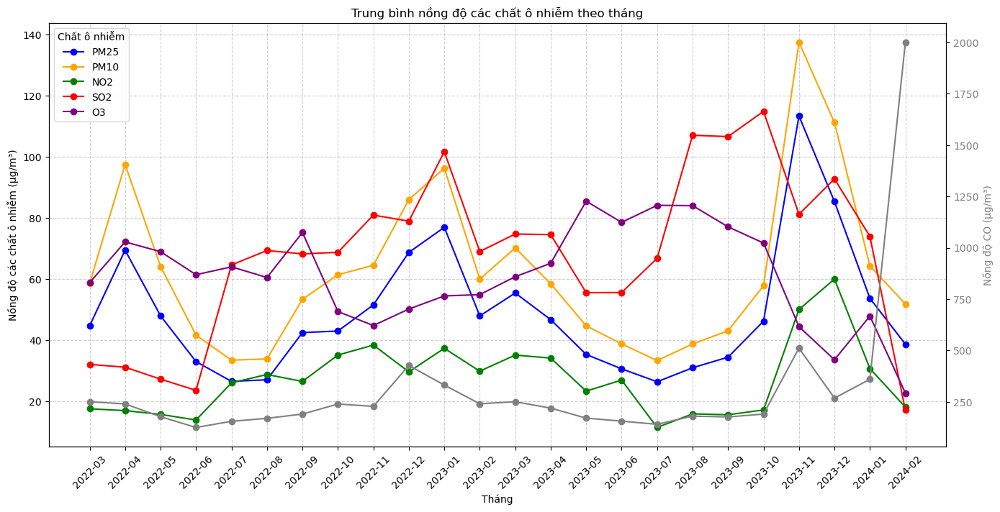

In [34]:
# Tính giá trị trung bình theo tháng
pollutants = ['PM25', 'PM10', 'NO2', 'CO', 'SO2', 'O3']
df_monthly_avg = df.resample('M')[pollutants].mean()
df_monthly_avg['month_year'] = df_monthly_avg.index.to_period('M').astype(str)

# Vẽ biểu đồ
fig, ax1 = plt.subplots(figsize=(14, 7))

# Vẽ các chất ô nhiễm trên trục y chính (trừ CO)
colors = ['blue', 'orange', 'green', 'red', 'purple']
for i, pollutant in enumerate(['PM25', 'PM10', 'NO2', 'SO2', 'O3']):
    ax1.plot(df_monthly_avg['month_year'], df_monthly_avg[pollutant], label=pollutant, marker='o', color=colors[i])

# Thiết lập trục y chính
ax1.set_xlabel('Tháng')
ax1.set_ylabel('Nồng độ các chất ô nhiễm (µg/m³)')
ax1.set_xticks(range(len(df_monthly_avg['month_year'])))
ax1.set_xticklabels(df_monthly_avg['month_year'], rotation=45, fontsize=10)
ax1.legend(loc='upper left', title='Chất ô nhiễm')
ax1.grid(True, linestyle='--', alpha=0.6)

# Tạo trục y phụ cho CO
ax2 = ax1.twinx()
ax2.plot(df_monthly_avg['month_year'], df_monthly_avg['CO'], label='CO', marker='o', color='gray')
ax2.set_ylabel('Nồng độ CO (µg/m³)', color='gray')
ax2.tick_params(axis='y', labelcolor='gray')

# Hiển thị biểu đồ
fig.tight_layout()
plt.title('Trung bình nồng độ các chất ô nhiễm theo tháng')
plt.show()

#### 4.4 Plot 6 chất ô nhiễm theo trung bình giờ

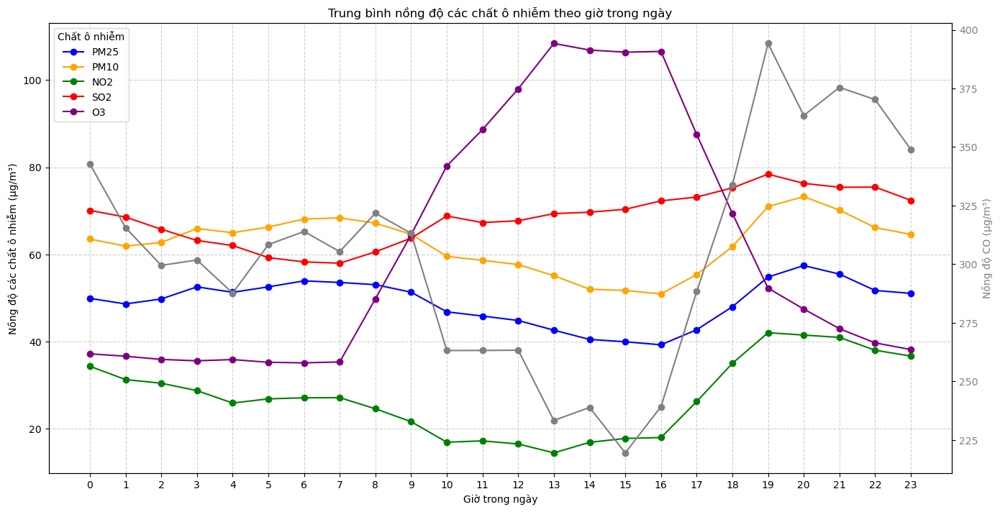

In [37]:
# Tính trung bình nồng độ các chất ô nhiễm theo giờ
pollutants = ['PM25', 'PM10', 'NO2', 'CO', 'SO2', 'O3']
df_hourly_avg = df.groupby(df.index.hour)[pollutants].mean()

# Vẽ biểu đồ
fig, ax1 = plt.subplots(figsize=(14, 7))

# Vẽ các chất ô nhiễm trên trục y chính (trừ CO)
colors = ['blue', 'orange', 'green', 'red', 'purple']
for i, pollutant in enumerate(['PM25', 'PM10', 'NO2', 'SO2', 'O3']):
    ax1.plot(df_hourly_avg.index, df_hourly_avg[pollutant], label=pollutant, marker='o', color=colors[i])

# Thiết lập trục y chính
ax1.set_xlabel('Giờ trong ngày')
ax1.set_ylabel('Nồng độ các chất ô nhiễm (µg/m³)')
ax1.set_xticks(range(24))  # Hiển thị 24 giờ (0 đến 23)
ax1.set_xticklabels(range(24))
ax1.legend(loc='upper left', title='Chất ô nhiễm')
ax1.grid(True, linestyle='--', alpha=0.6)

# Tạo trục y phụ cho CO
ax2 = ax1.twinx()
ax2.plot(df_hourly_avg.index, df_hourly_avg['CO'], label='CO', marker='o', color='gray')
ax2.set_ylabel('Nồng độ CO (µg/m³)', color='gray')
ax2.tick_params(axis='y', labelcolor='gray')

# Hiển thị biểu đồ
fig.tight_layout()
plt.title('Trung bình nồng độ các chất ô nhiễm theo giờ trong ngày')
plt.show()

### Bước 5: Phát hiện và xử lý outliers

array([[<Axes: title={'center': 'AQI'}>, <Axes: title={'center': 'CO'}>,
        <Axes: title={'center': 'NO2'}>, <Axes: title={'center': 'O3'}>],
       [<Axes: title={'center': 'PM10'}>,
        <Axes: title={'center': 'PM25'}>,
        <Axes: title={'center': 'SO2'}>,
        <Axes: title={'center': 'Clouds'}>],
       [<Axes: title={'center': 'Precip'}>,
        <Axes: title={'center': 'Pres'}>, <Axes: title={'center': 'Rh'}>,
        <Axes: title={'center': 'Solar_rad'}>],
       [<Axes: title={'center': 'Temp'}>,
        <Axes: title={'center': 'Vis'}>,
        <Axes: title={'center': 'Wind_spd'}>, <Axes: >]], dtype=object)

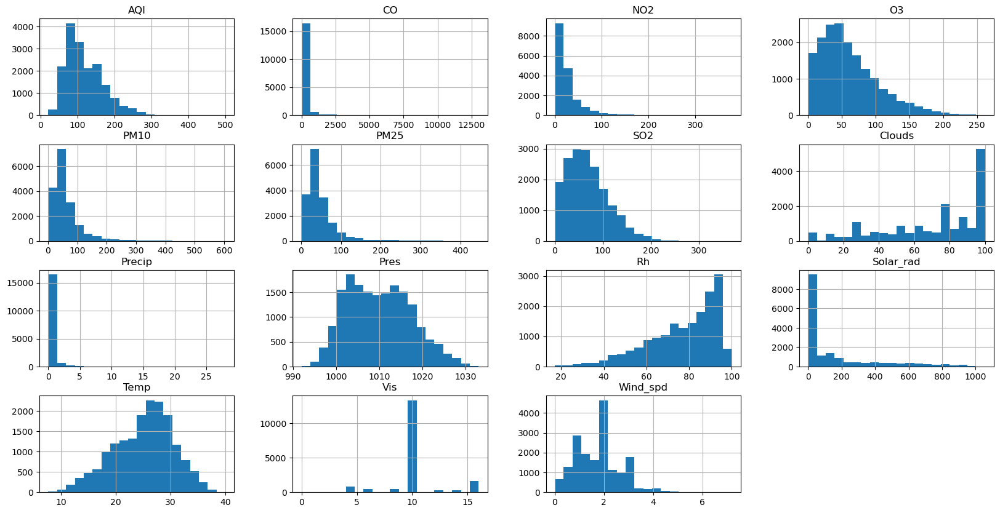

In [39]:
df.hist(bins = 20, figsize = (20,10))

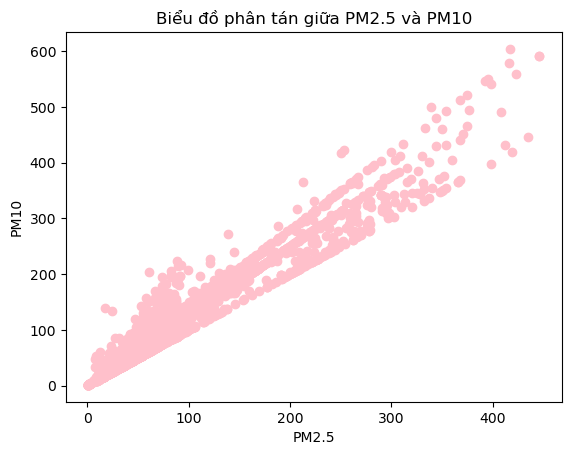

In [40]:
plt.scatter(df['PM25'], df['PM10'],c='pink')
plt.title('Biểu đồ phân tán giữa PM2.5 và PM10')
plt.xlabel('PM2.5')
plt.ylabel('PM10')

# Hiển thị biểu đồ
plt.show()

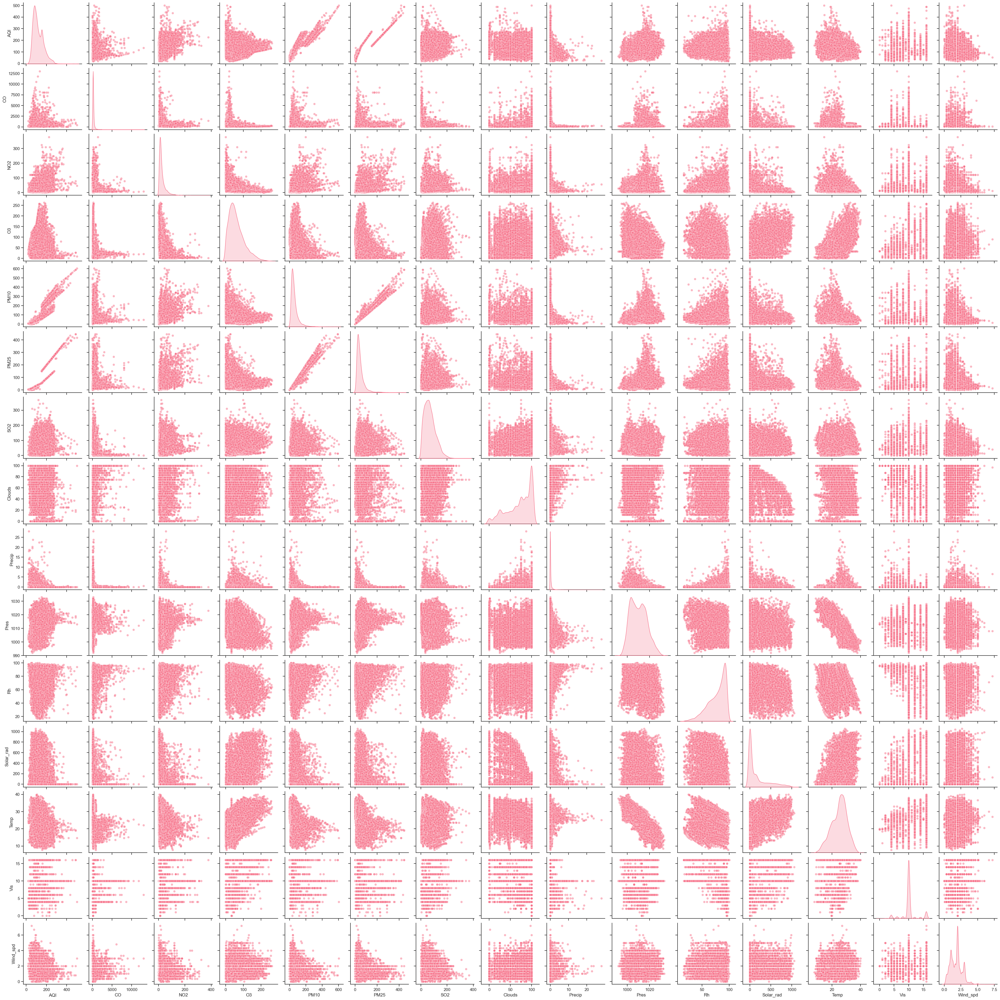

In [41]:
sn.set(style="ticks", palette="husl")
pairplot = sn.pairplot(df, diag_kind='kde', plot_kws={'alpha': 0.5})

In [40]:
#Function to detect outliers using IQR
def detect_outliers(df,column):
    Q1 = np.quantile(df[column],0.25)
    Q3 = np.quantile(df[column],0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    return (df[column] < lower_bound) | (df[column] > upper_bound)

In [42]:
#Detect outliers
outlier1 = detect_outliers(df,'AQI')
print(f"Số lượng outliers AQI phát hiện: {sum(outlier1)}")
#Detect outliers
outlier2 = detect_outliers(df,'PM10')
print(f"Số lượng outliers PM10 phát hiện: {sum(outlier2)}")
#Detect outliers
outlier3 = detect_outliers(df,'PM25')
print(f"Số lượng outliers PM25 phát hiện: {sum(outlier3)}")
#Detect outliers
outlier4 = detect_outliers(df,'CO')
print(f"Số lượng outliers CO phát hiện: {sum(outlier4)}")
#Detect outliers
outlier5 = detect_outliers(df,'NO2')
print(f"Số lượng outliers NO2 phát hiện: {sum(outlier5)}")
#Detect outliers
outlier6 = detect_outliers(df,'O3')
print(f"Số lượng outliers O3 phát hiện: {sum(outlier6)}")
#Detect outliers
outlier7 = detect_outliers(df,'SO2')
print(f"Số lượng outliers SO2 phát hiện: {sum(outlier7)}")

Số lượng outliers AQI phát hiện: 230
Số lượng outliers PM10 phát hiện: 1286
Số lượng outliers PM25 phát hiện: 1182
Số lượng outliers CO phát hiện: 1801
Số lượng outliers NO2 phát hiện: 1543
Số lượng outliers O3 phát hiện: 474
Số lượng outliers SO2 phát hiện: 273


In [44]:
df = df.drop(columns=['month_year','City'])

In [46]:
df.head()

,AQI,CO,NO2,O3,PM10,PM25,SO2,Clouds,Precip,Pres,Rh,Solar_rad,Temp,Vis,Wind_spd
Local Time,,,,,,,,,,,,,,,
2022-03-01 00:00:00,150.0,384.0,38.0,45.0,67.5,54.0,84.3,91,0.00,1015,76,0,19.9,10,2.33
2022-03-01 01:00:00,155.0,439.5,47.0,32.0,73.8,59.0,103.0,87,0.00,1014,79,0,19.7,10,2.00
2022-03-01 02:00:00,152.0,529.3,49.7,21.3,71.3,57.0,97.3,91,0.00,1014,80,0,19.6,10,2.00
2022-03-01 03:00:00,153.0,619.2,52.3,10.7,72.5,58.0,91.7,95,0.75,1014,81,0,19.6,10,2.00
2022-03-01 04:00:00,157.0,709.1,55.0,0.0,76.3,61.0,86.0,100,1.50,1014,83,0,19.5,10,2.00


### Bước 6: Kiểm tra tương quan giữa các biến (biến độc lập đối với biến phụ thuộc)

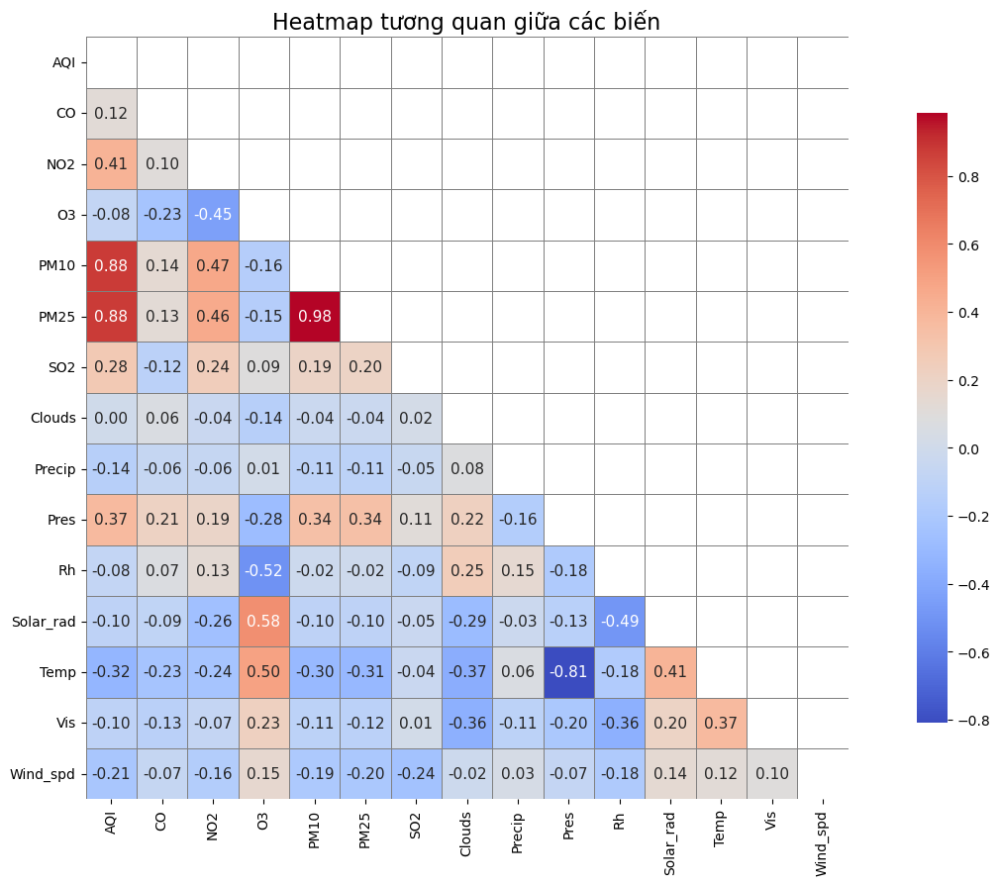

In [49]:
plt.figure(figsize=(18, 10))
# Tính ma trận tương quan
correlation_matrix = df.corr()
# Vẽ heatmap
sn.heatmap(correlation_matrix, 
            annot=True,               # Hiển thị giá trị trong mỗi ô
            fmt=".2f",                # Định dạng số thập phân
            cmap='coolwarm',          # Chọn bảng màu
            square=True,              # Đảm bảo heatmap có hình vuông
            linewidths=0.5,           # Độ dày của đường viền giữa các ô
            linecolor='gray',         # Màu của đường viền
            cbar_kws={"shrink": 0.8}, # Điều chỉnh độ dài của thanh màu
            annot_kws={'size': 11},   # Kích thước font của số trong ô
            mask=np.triu(correlation_matrix))  # Mặt nạ nửa trên của ma trận (các giá trị đối xứng)

# Thêm tiêu đề cho heatmap
plt.title('Heatmap tương quan giữa các biến', fontsize=16)

# Hiển thị biểu đồ
plt.show()

Loại Clouds ra khỏi các yếu tố đầu vào vì tương quan với AQI xấp xỉ 0 => PM10 và PM2.5 tương quan rất mạnh (0.98) do trong thành phần của PM10 có chứa PM2.5

In [52]:
df = df.drop(columns=['Clouds'])

In [54]:
df.head()

,AQI,CO,NO2,O3,PM10,PM25,SO2,Precip,Pres,Rh,Solar_rad,Temp,Vis,Wind_spd
Local Time,,,,,,,,,,,,,,
2022-03-01 00:00:00,150.0,384.0,38.0,45.0,67.5,54.0,84.3,0.00,1015,76,0,19.9,10,2.33
2022-03-01 01:00:00,155.0,439.5,47.0,32.0,73.8,59.0,103.0,0.00,1014,79,0,19.7,10,2.00
2022-03-01 02:00:00,152.0,529.3,49.7,21.3,71.3,57.0,97.3,0.00,1014,80,0,19.6,10,2.00
2022-03-01 03:00:00,153.0,619.2,52.3,10.7,72.5,58.0,91.7,0.75,1014,81,0,19.6,10,2.00
2022-03-01 04:00:00,157.0,709.1,55.0,0.0,76.3,61.0,86.0,1.50,1014,83,0,19.5,10,2.00


<Figure size 1000x600 with 0 Axes>

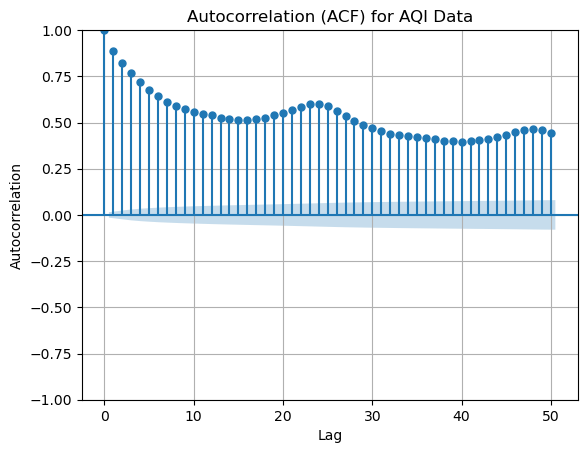

In [168]:
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
lags = 50  # Số độ trễ
acf_aqi = acf(df['AQI'], nlags=lags)

# Vẽ đồ thị ACF
plt.figure(figsize=(10, 6))
plot_acf(df['AQI'], lags=lags)
plt.title("Autocorrelation (ACF) for AQI Data")
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
plt.grid()
plt.show()

### Bước 7: Chọn đặc trưng và mục tiêu

In [140]:
x = df.drop(columns='AQI').values
y = df['AQI'].values

In [142]:
split_index = int(0.8 * len(x))
x_train, x_test = x[:split_index], x[split_index:]
y_train, y_test = y[:split_index], y[split_index:]

### Bước 8: Chuẩn hóa dữ liệu bằng Min-Max Scaler trên tập biến đặc trưng

In [145]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
# Chuẩn hóa dữ liệu trên tập train
scaler_x = MinMaxScaler(feature_range=(0, 1))
scaler_y = MinMaxScaler(feature_range=(0, 1))
scaled_x_train = scaler_x.fit_transform(x_train)
scaled_y_train = scaler_y.fit_transform(y_train.reshape(-1,1))

In [147]:
# Áp dụng scaler đã fit cho tập test
scaled_x_test = scaler_x.transform(x_test)
scaled_y_test = scaler_y.transform(y_test.reshape(-1,1))

#### Bước 9: Tách dữ liệu thành tập huấn luyện và tập kiểm tra

In [150]:
x_train = scaled_x_train
y_train = scaled_y_train 
x_test = scaled_x_test
y_test = scaled_y_test
# Kiểm tra kích thước của các tập dữ liệu
print(f"Kích thước tập huấn luyện: {x_train.shape}")
print(f"Kích thước tập kiểm tra: {x_test.shape}")

Kích thước tập huấn luyện: (14035, 13)
Kích thước tập kiểm tra: (3509, 13)


### Bước 10: Huấn luyện các mô hình học máy

In [153]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error

#### 10.1 Random Forest

In [156]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

# Định nghĩa mô hình Random Forest Regressor
rf = RandomForestRegressor(random_state=42)

# 1. Sử dụng RandomizedSearchCV để tìm phạm vi tham số tốt
random_grid = {
    'n_estimators': [int(x) for x in np.linspace(100, 200, 10)],
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [None] + list(np.linspace(10, 50, 5, dtype=int)),
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

random_search = RandomizedSearchCV(estimator=rf, param_distributions=random_grid, 
                                   n_iter=50, scoring='neg_mean_squared_error', 
                                   cv=5, verbose=2, random_state=42, n_jobs=-1)

random_search.fit(x_train, y_train)

print("Best parameters from RandomizedSearchCV:")
print(random_search.best_params_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Best parameters from RandomizedSearchCV:
{'n_estimators': 155, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 10, 'bootstrap': True}


In [158]:
# 2. Dùng kết quả của RandomizedSearchCV để định nghĩa phạm vi hẹp hơn cho GridSearchCV
param_grid = {
    'n_estimators': [random_search.best_params_['n_estimators'] - 10, random_search.best_params_['n_estimators'], random_search.best_params_['n_estimators'] + 10],
    'max_features': [random_search.best_params_['max_features']],
    'max_depth': [random_search.best_params_['max_depth'] - 9, random_search.best_params_['max_depth'], random_search.best_params_['max_depth'] + 10],
    'min_samples_split': [random_search.best_params_['min_samples_split']],
    'min_samples_leaf': [random_search.best_params_['min_samples_leaf']],
    'bootstrap': [random_search.best_params_['bootstrap']]
}

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                           scoring='neg_mean_squared_error', cv=5, 
                           verbose=2, n_jobs=-1)

grid_search.fit(x_train, y_train)

print("Best parameters from GridSearchCV:")
print(grid_search.best_params_)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Best parameters from GridSearchCV:
{'bootstrap': True, 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 165}


In [160]:
# Đánh giá mô hình với bộ tham số tối ưu
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(x_test)

# Đánh giá hiệu suất
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test,y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error Score (MAE): {mae}")
print(f"R^2 Score: {r2}")

Mean Squared Error (MSE): 0.00016051595693036247
Root Mean Squared Error (RMSE): 0.012669489213475122
Mean Absolute Error Score (MAE): 0.002506818976509794
R^2 Score: 0.9918882449241339


In [170]:
(1-0.002507)*100

99.74929999999999

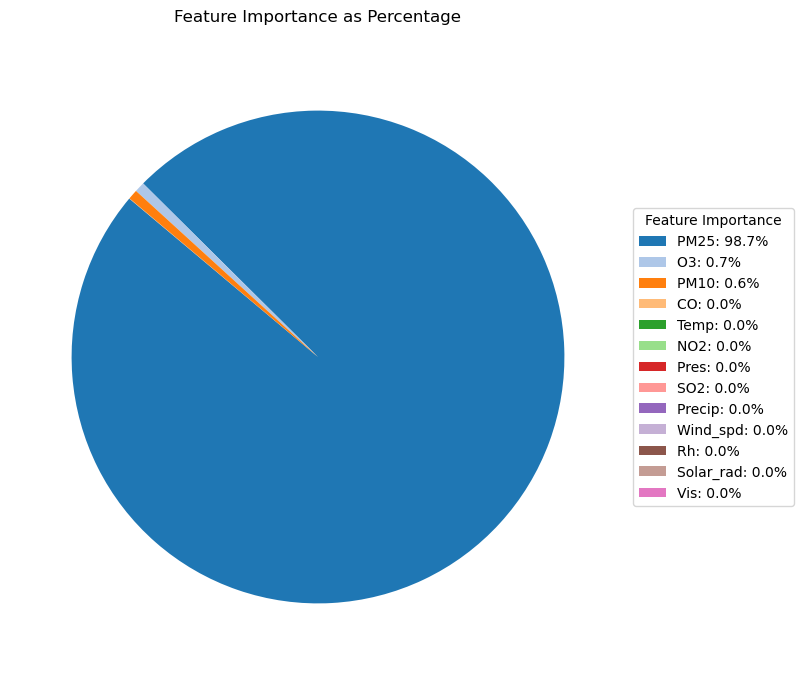

In [164]:
# Trích xuất độ quan trọng của các đặc trưng
feature_importances = best_rf.feature_importances_
features = df.drop(columns='AQI').columns  # Tên các đặc trưng

# Chuyển thành tỷ lệ phần trăm
feature_percentages = 100 * (feature_importances / feature_importances.sum())

# Sắp xếp tỷ lệ phần trăm và tên đặc trưng theo thứ tự từ cao đến thấp
sorted_idx = feature_percentages.argsort()[::-1]  # Sắp xếp giảm dần
sorted_feature_percentages = feature_percentages[sorted_idx]
sorted_features = features[sorted_idx]

# Vẽ biểu đồ tròn mà không hiển thị tên biến trên biểu đồ
plt.figure(figsize=(8, 8))
wedges, _ = plt.pie(sorted_feature_percentages, startangle=140, colors=plt.cm.tab20.colors)

# Thêm legend bên phải với tỷ lệ phần trăm và tên đặc trưng
plt.legend(wedges, [f"{feature}: {percent:.1f}%" for feature, percent in zip(sorted_features, sorted_feature_percentages)],
           title="Feature Importance", loc="center left", bbox_to_anchor=(1, 0.5), fontsize=10)
plt.title("Feature Importance as Percentage", pad=20)
plt.show()

#### 10.2 XGBoost

In [162]:
pip install xgboost

In [132]:
from xgboost import XGBRegressor
# 4. Xây dựng mô hình XGBoost ban đầu
xgb = XGBRegressor(objective='reg:squarederror', random_state=42)

# 5. Thiết lập các siêu tham số để tìm kiếm bằng RandomizedSearchCV
random_grid = {
    'n_estimators': [80, 200, 300],
    'max_depth': [3, 5, 10, 15, 20],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'reg_alpha': [0, 0.1, 1, 10],
    'reg_lambda': [0.1, 1, 10]
}

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=random_grid,
    n_iter=50,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

# 6. Huấn luyện RandomizedSearchCV
random_search.fit(x_train, y_train)

print("Best parameters from RandomizedSearchCV:")
print(random_search.best_params_)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best parameters from RandomizedSearchCV:
{'subsample': 1.0, 'reg_lambda': 0.1, 'reg_alpha': 0, 'n_estimators': 80, 'max_depth': 10, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 1.0}


In [134]:
# 7. Tìm siêu tham số tốt hơn bằng GridSearchCV với phạm vi hẹp hơn
param_grid = {
    'n_estimators': [random_search.best_params_['n_estimators'] - 20, random_search.best_params_['n_estimators'], random_search.best_params_['n_estimators'] + 50],
    'max_depth': [random_search.best_params_['max_depth'] - 2, random_search.best_params_['max_depth'], random_search.best_params_['max_depth'] + 2],
    'learning_rate': [random_search.best_params_['learning_rate'] - 0.01, random_search.best_params_['learning_rate'], random_search.best_params_['learning_rate'] + 0.02],
     'subsample': [random_search.best_params_['subsample'] - 0.1, random_search.best_params_['subsample']],
    'colsample_bytree': [random_search.best_params_['colsample_bytree'] - 0.1, random_search.best_params_['colsample_bytree']],
    'reg_lambda': [random_search.best_params_['reg_lambda'] - 0.05, random_search.best_params_['reg_lambda'], random_search.best_params_['reg_lambda'] + 0.1]
}

# GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=2,
    n_jobs=-1
)

# 8. Huấn luyện GridSearchCV
grid_search.fit(x_train, y_train)

print("Best parameters from GridSearchCV:")
print(grid_search.best_params_)

Fitting 3 folds for each of 324 candidates, totalling 972 fits
Best parameters from GridSearchCV:
{'colsample_bytree': 0.9, 'learning_rate': 0.22, 'max_depth': 10, 'n_estimators': 60, 'reg_lambda': 0.1, 'subsample': 0.9}


In [136]:
# 9. Dự báo với mô hình tối ưu
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test)

In [138]:
# Đánh giá hiệu suất
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test,y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error Score (MAE): {mae}")
print(f"R^2 Score: {r2}")

Mean Squared Error (MSE): 0.0014113122881269885
Root Mean Squared Error (RMSE): 0.037567436539202255
Mean Absolute Error Score (MAE): 0.011432827423056294
R^2 Score: 0.928678619647684


In [172]:
(1-0.011433)*100

98.8567

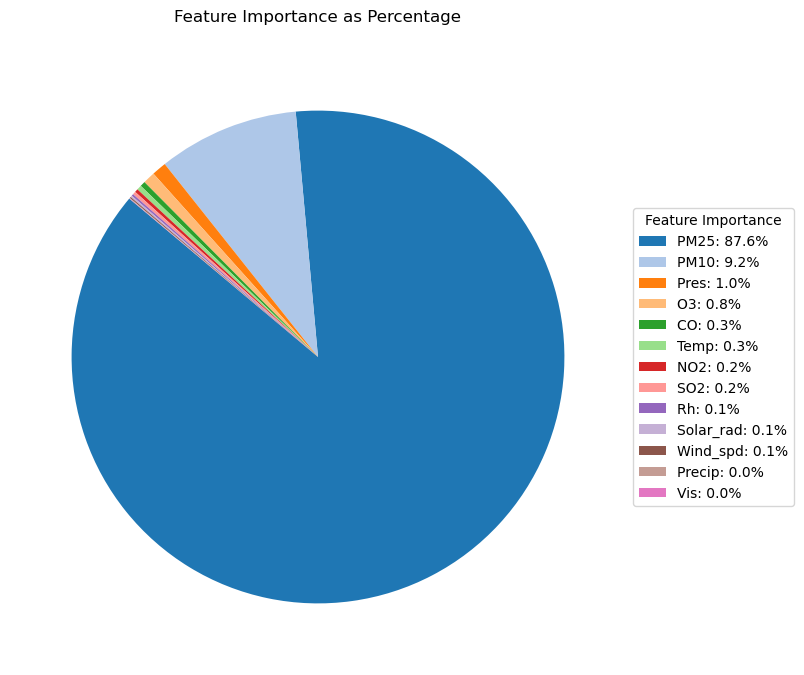

In [162]:
# Trích xuất độ quan trọng của các đặc trưng
feature_importances = best_model.feature_importances_
features = df.drop(columns='AQI').columns  # Tên các đặc trưng

# Chuyển thành tỷ lệ phần trăm
feature_percentages = 100 * (feature_importances / feature_importances.sum())

# Sắp xếp tỷ lệ phần trăm và tên đặc trưng theo thứ tự từ cao đến thấp
sorted_idx = feature_percentages.argsort()[::-1]  # Sắp xếp giảm dần
sorted_feature_percentages = feature_percentages[sorted_idx]
sorted_features = features[sorted_idx]

# Vẽ biểu đồ tròn mà không hiển thị tên biến trên biểu đồ
plt.figure(figsize=(8, 8))
wedges, _ = plt.pie(sorted_feature_percentages, startangle=140, colors=plt.cm.tab20.colors)

# Thêm legend bên phải với tỷ lệ phần trăm và tên đặc trưng
plt.legend(wedges, [f"{feature}: {percent:.1f}%" for feature, percent in zip(sorted_features, sorted_feature_percentages)],
           title="Feature Importance", loc="center left", bbox_to_anchor=(1, 0.5), fontsize=10)
plt.title("Feature Importance as Percentage", pad=20)
plt.show()

#### 10.3 CatBoost

In [107]:
pip install catboost

   ---------------------------------------- 0.0/101.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/101.7 MB 682.7 kB/s eta 0:02:29
   ---------------------------------------- 0.0/101.7 MB 495.5 kB/s eta 0:03:26
   ---------------------------------------- 0.1/101.7 MB 845.5 kB/s eta 0:02:01
   ---------------------------------------- 0.1/101.7 MB 804.6 kB/s eta 0:02:07
   ---------------------------------------- 0.2/101.7 MB 958.4 kB/s eta 0:01:46
   ---------------------------------------- 0.2/101.7 MB 935.2 kB/s eta 0:01:49
   ---------------------------------------- 0.3/101.7 MB 1.1 MB/s eta 0:01:33
   ---------------------------------------- 0.4/101.7 MB 1.1 MB/s eta 0:01:35
   ---------------------------------------- 0.5/101.7 MB 1.2 MB/s eta 0:01:24
   ---------------------------------------- 0.5/101.7 MB 1.2 MB/s eta 0:01:26
   ---------------------------------------- 0.5/101.7 MB 1.1 MB/s eta 0:01:32
   ---------------------------------------- 0.6/101.7 MB 1.

In [174]:
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV

In [176]:
model = CatBoostRegressor(random_state=42)
# Định nghĩa không gian tham số cho RandomizedSearchCV với 'l2_leaf_reg'
param_grid = {
    'iterations': [500, 1000],  # Số vòng lặp 
    'learning_rate': [0.01, 0.05],  # Tốc độ học
    'depth': [4, 6],  # Độ sâu của cây quyết định
    'l2_leaf_reg': [1, 3],  # Điều chỉnh regularization L2 cho lá
    'subsample': [0.6, 0.7],  # Tỷ lệ mẫu được sử dụng trong mỗi lần huấn luyện
    'min_data_in_leaf': [1, 3],  # Số lượng mẫu tối thiểu trong mỗi lá cây
}

In [178]:
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, verbose=3, n_jobs=-1)
grid_search.fit(x_train, y_train)

# In ra kết quả của GridSearchCV
print("Best parameters from GridSearchCV:", grid_search.best_params_)

Fitting 3 folds for each of 64 candidates, totalling 192 fits
0:	learn: 0.1005861	total: 149ms	remaining: 2m 28s
1:	learn: 0.0961380	total: 153ms	remaining: 1m 16s
2:	learn: 0.0918716	total: 159ms	remaining: 52.9s
3:	learn: 0.0877648	total: 164ms	remaining: 40.9s
4:	learn: 0.0838606	total: 169ms	remaining: 33.7s
5:	learn: 0.0801841	total: 175ms	remaining: 28.9s
6:	learn: 0.0767338	total: 179ms	remaining: 25.4s
7:	learn: 0.0735578	total: 186ms	remaining: 23.1s
8:	learn: 0.0704015	total: 190ms	remaining: 20.9s
9:	learn: 0.0673254	total: 194ms	remaining: 19.2s
10:	learn: 0.0644789	total: 198ms	remaining: 17.8s
11:	learn: 0.0618061	total: 203ms	remaining: 16.7s
12:	learn: 0.0592357	total: 207ms	remaining: 15.7s
13:	learn: 0.0566692	total: 211ms	remaining: 14.9s
14:	learn: 0.0543542	total: 215ms	remaining: 14.1s
15:	learn: 0.0520805	total: 218ms	remaining: 13.4s
16:	learn: 0.0499920	total: 223ms	remaining: 12.9s
17:	learn: 0.0480273	total: 227ms	remaining: 12.4s
18:	learn: 0.0461103	total: 

In [180]:
# Sử dụng mô hình với tham số tối ưu để dự đoán
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test)

# Đánh giá hiệu suất
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test,y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error Score (MAE): {mae}")
print(f"R^2 Score: {r2}")

Mean Squared Error (MSE): 0.0007286203962438668
Root Mean Squared Error (RMSE): 0.02699296938545048
Mean Absolute Error Score (MAE): 0.009540951601653165
R^2 Score: 0.9631787997240989


In [184]:
(1-0.009541)*100

99.0459

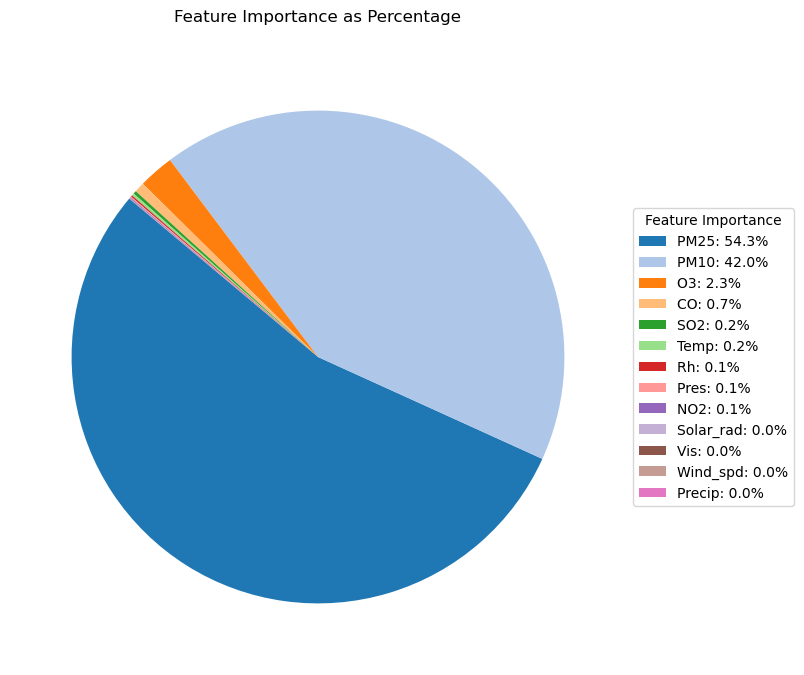

In [182]:
# Trích xuất độ quan trọng của các đặc trưng
feature_importances = best_model.feature_importances_
features = df.drop(columns='AQI').columns  # Tên các đặc trưng

# Chuyển thành tỷ lệ phần trăm
feature_percentages = 100 * (feature_importances / feature_importances.sum())

# Sắp xếp tỷ lệ phần trăm và tên đặc trưng theo thứ tự từ cao đến thấp
sorted_idx = feature_percentages.argsort()[::-1]  # Sắp xếp giảm dần
sorted_feature_percentages = feature_percentages[sorted_idx]
sorted_features = features[sorted_idx]

# Vẽ biểu đồ tròn mà không hiển thị tên biến trên biểu đồ
plt.figure(figsize=(8, 8))
wedges, _ = plt.pie(sorted_feature_percentages, startangle=140, colors=plt.cm.tab20.colors)

# Thêm legend bên phải với tỷ lệ phần trăm và tên đặc trưng
plt.legend(wedges, [f"{feature}: {percent:.1f}%" for feature, percent in zip(sorted_features, sorted_feature_percentages)],
           title="Feature Importance", loc="center left", bbox_to_anchor=(1, 0.5), fontsize=10)
plt.title("Feature Importance as Percentage", pad=20)
plt.show()

#### 10.4 LSTM

In [121]:
pip install scikeras

Note: you may need to restart the kernel to use updated packages.


In [74]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from scikeras.wrappers import KerasRegressor

In [188]:
data_train = np.hstack((scaled_x_train, scaled_y_train))
data_test = np.hstack((scaled_x_test, scaled_y_test))

In [248]:
def create_sequences(df, sequence_length):
    x, y = [], []
    for i in range(len(df) - sequence_length):
        x.append(df[i:i + sequence_length, :-1])  # Các feature
        y.append(df[i + sequence_length, -1])    # AQI
    return np.array(x), np.array(y)

sequence_length = 28
x_train, y_train = create_sequences(data_train, sequence_length)
x_test, y_test = create_sequences(data_test, sequence_length)

In [256]:
def LSTM_model():
    model = Sequential()
    model.add(LSTM(units = 128, return_sequences = True, input_shape = (x_train.shape[1], x_train.shape[2])))
    #Add lớp dropout để tránh overfitting
    model.add(Dropout(0.2))
    
    model.add(LSTM(units = 64))
    #Add dropout để tránh overfitting
    model.add(Dropout(0.2))
    
    model.add(Dense(units=1))
    
    return model

In [258]:
model = LSTM_model()
model.summary()
model.compile(
    optimizer='adam', 
    loss='mean_squared_error'
)

C:\Users\DELL\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_22 (LSTM)                  │ (None, 28, 128)        │        72,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 28, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_23 (LSTM)                  │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 122,177 (477.25 KB)

 Trainable params: 122,177 (477.25 KB)

 Non-trainable params: 0 (0.00 B)

In [260]:
model.fit(
    x_train, 
    y_train, 
    epochs=10, 
    batch_size = 16
)

Epoch 1/10
876/876 ━━━━━━━━━━━━━━━━━━━━ 18s 15ms/step - loss: 0.0082
Epoch 2/10
876/876 ━━━━━━━━━━━━━━━━━━━━ 14s 16ms/step - loss: 0.0034
Epoch 3/10
876/876 ━━━━━━━━━━━━━━━━━━━━ 14s 16ms/step - loss: 0.0030
Epoch 4/10
876/876 ━━━━━━━━━━━━━━━━━━━━ 14s 16ms/step - loss: 0.0024
Epoch 5/10
876/876 ━━━━━━━━━━━━━━━━━━━━ 21s 16ms/step - loss: 0.0024
Epoch 6/10
876/876 ━━━━━━━━━━━━━━━━━━━━ 15s 18ms/step - loss: 0.0022
Epoch 7/10
876/876 ━━━━━━━━━━━━━━━━━━━━ 22s 19ms/step - loss: 0.0023
Epoch 8/10
876/876 ━━━━━━━━━━━━━━━━━━━━ 15s 17ms/step - loss: 0.0022
Epoch 9/10
876/876 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0022
Epoch 10/10
876/876 ━━━━━━━━━━━━━━━━━━━━ 35s 16ms/step - loss: 0.0022


In [262]:
y_pred = model.predict(x_test)

109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


In [264]:
# Đánh giá hiệu suất
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test,y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error Score (MAE): {mae}")
print(f"R^2 Score: {r2}")

Mean Squared Error (MSE): 0.006475702153508747
Root Mean Squared Error (RMSE): 0.08047174754849523
Mean Absolute Error Score (MAE): 0.05400814364879318
R^2 Score: 0.6742551049378066


In [266]:
(1-0.054008)*100

94.5992